In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
from PIL import Image
from scipy.misc import imread
%matplotlib inline
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')

# Simple K-Means
In this assignment, we will walk you through an implementation of the simple K-Means algorithm.

The K-means algorithm works as follows, assuming we have inputs $x_{1}$, $x_{2}$, $x_{3}$, ..., $x_{n}$ and value of K
- Step 1 - Pick K random points as cluster centers called centroids.
- Step 2 - Assign each $x_{i}$ to nearest cluster by calculating its distance to each centroid.
- Step 3 - Find new cluster center by taking the average of the assigned points.
- Step 4 - Repeat Step 2 and 3 until none of the cluster assignments change.

![alt text](kmeansdetail.gif "2D K-means")

### Importing the data

In [13]:
data = pd.read_csv('xclara.csv')
print(data.shape)
data.head()

(3000, 2)


,V1,V2
0,2.072345,-3.241693
1,17.936710,15.784810
2,1.083576,7.319176
3,11.120670,14.406780
4,23.711550,2.557729


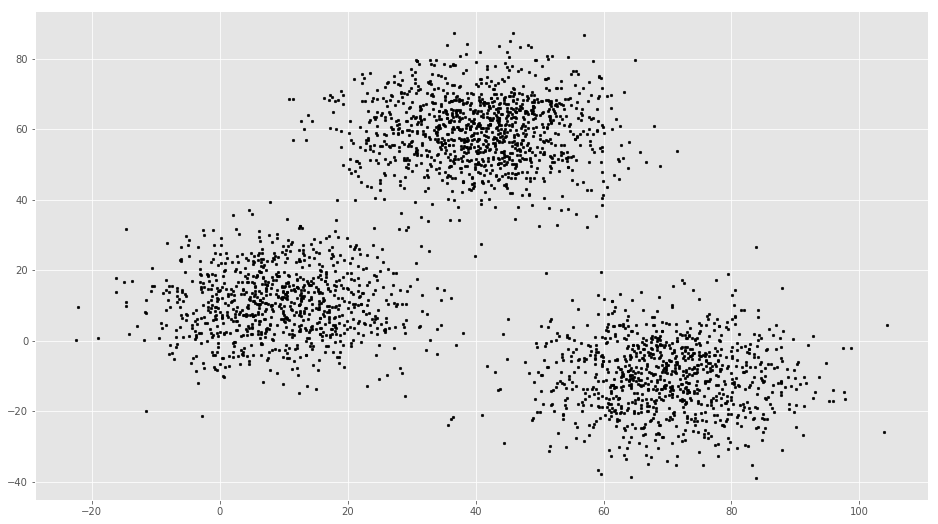

In [14]:
# Getting the values and plotting it
f1 = data['V1'].values
f2 = data['V2'].values
X = np.array(list(zip(f1, f2)))
plt.scatter(f1, f2, c='black', s=7)

In [15]:
#Number of clusters
k = 3
colors = ['red', 'green', 'blue']

### Step 1: Initialize k random points as centroids
Hint: use the function np.random.randint

In [16]:
#TODO:
# X coordinates of random centroids
C_x = np.random.randint(0, high = k,size = (data.shape[0],data.shape[1]))
# Y coordinates of random centroids
C_y = np.random.randint(0, high = k,size = (data.shape[0],data.shape[1]))
# Zip the arrays C_x and C_y into a list of tuples (C_x, C_y)
C = np.array(list(zip(C_x,C_y)), dtype=np.float32)

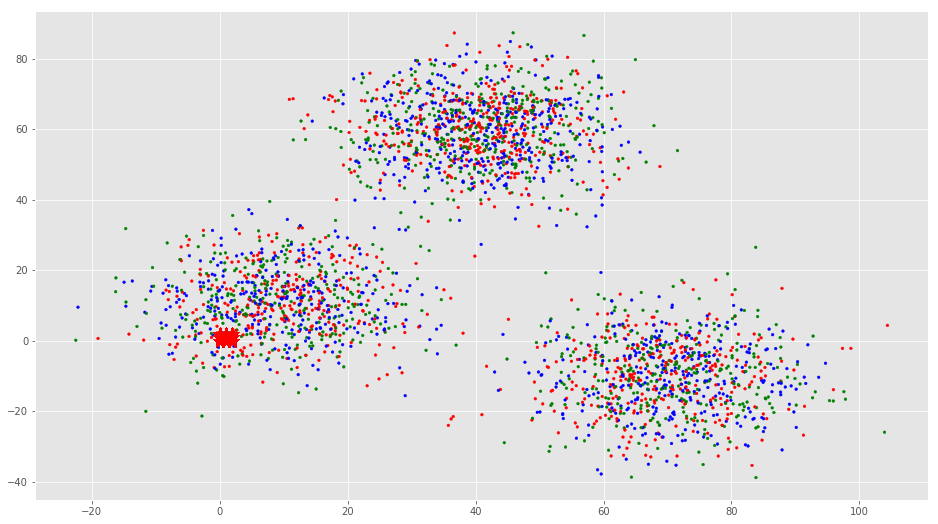

In [17]:
# Plotting along with the Centroids
plt.scatter(f1, f2, c=colors, s=7)
plt.scatter(C_x, C_y, marker='*', s=200, c='red')

### Step 2: Assign each $x_{i}$ to nearest cluster by calculating its distance to each centroid.

In [18]:
# TODO: Euclidean Distance Caculator
# Hint: use np.linalg.norm
def dist(a, b, ax=1):
    return np.linalg.norm(a-b)

In [19]:
from copy import deepcopy

# To store the value of centroids when it updates
C_old = np.zeros(C.shape)
# Cluster Labels(0, 1, 2)
clusters = np.zeros(len(X))

# TODO: Error func. - Distance between new centroids and old centroids
# Hint: use the function dist()
error = dist(C_old,C)

In [21]:
# Loop will run till the error becomes zero
while error != 0:
    # Assigning each value to its closest cluster
    for i in range(len(X)):
        #TODO: Compute distances between each point and the centroid and 
        #   assign it to the cluster of the closest centroid
        distances = dist(X[i],C[i])
        cluster = np.argmin(distances)
        clusters[i] = cluster
    # Storing the old centroid values
    C_old = deepcopy(C)
    # Finding the new centroids by taking the average value
    for i in range(k):
        points = [X[j] for j in range(len(X)) if X.size > 0]
        #TODO: compute average
        C[i] = points[i].mean()
    error = 0

IndexError: too many indices for array

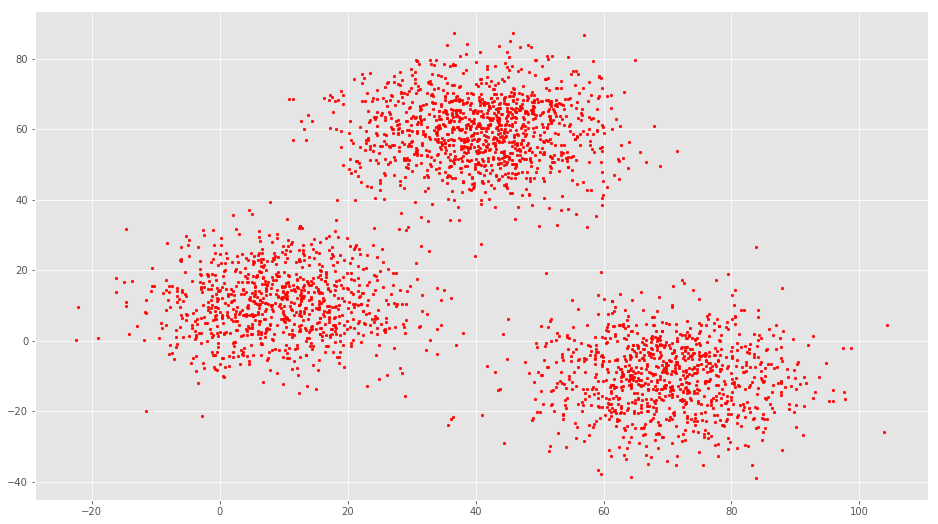

In [22]:
fig, ax = plt.subplots()
for i in range(k):
        points = np.array([X[j] for j in range(len(X)) if clusters[j] == i])
        ax.scatter(points[:, 0], points[:, 1], s=7, c=colors[i])
ax.scatter(C[:, 0], C[:, 1], marker='*', s=200, c='#050505')


# K-Means Clustering on audio
This part walks you through a simple application of clustering on audio processing. The goal is to cluster the onsets of a music track in the time domain. Onset is the beginning of a musical note which is characterized by increases in spectral energy, changes in spectral energy distribution/phase, changes in detected pitch or even spectral patterns recognizable by machine learning techniques such as neural networks.

In [23]:
!pip install librosa
!pip install mir_eval
#NOTE: RESTART NOTEBOOK FROM TERMINAL IF ERROR OCCURS

import numpy, scipy, matplotlib.pyplot as plt, sklearn, librosa, mir_eval, IPython.display, urllib
plt.rcParams['figure.figsize'] = (14, 4)

In [24]:
filename = 'audio.mp3'
IPython.display.Audio(filename)

Load the audio file into an array

In [25]:
x, fs = librosa.load(filename)
print(fs)

22050


Plot audio signal

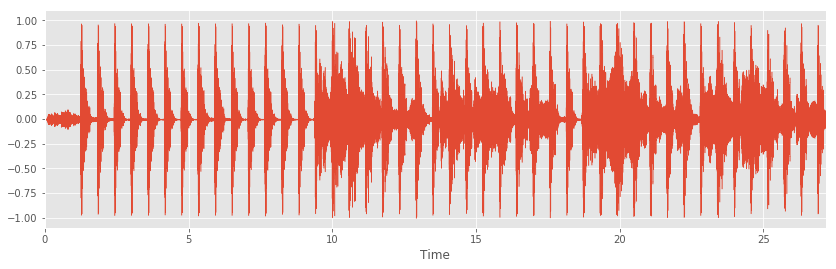

In [26]:
import librosa.display
librosa.display.waveplot(x, fs)

### Onset Detection

In [27]:
onset_frames = librosa.onset.onset_detect(x, sr=fs, delta=0.04, wait=4)
onset_times = librosa.frames_to_time(onset_frames, sr=fs)
onset_samples = librosa.frames_to_samples(onset_frames)

The detected onsets are marked as 'beeps'

In [28]:
x_with_beeps = mir_eval.sonify.clicks(onset_times, fs, length=len(x))
IPython.display.Audio(x + x_with_beeps, rate=fs)

### Feature Extraction
Compute the zero crossing rate and energy for each detected onset

In [29]:
def extract_features(x, fs):
    zcr = librosa.zero_crossings(x).sum()
    energy = scipy.linalg.norm(x)
    return [zcr, energy]
frame_sz = int(fs*0.090)
features = numpy.array([extract_features(x[i:i+frame_sz], fs) for i in onset_samples])
print(features.shape)

(71, 2)


Scale the features from -1 to 1

In [30]:
min_max_scaler = sklearn.preprocessing.MinMaxScaler(feature_range=(-1, 1))
features_scaled = min_max_scaler.fit_transform(features)
print(features_scaled.shape)
print(features_scaled.min(axis=0))
print(features_scaled.max(axis=0))

(71, 2)
[-1. -1.]
[1. 1.]


Plot the scaled spectral centroid against the scaled zero crossing rate

Text(0,0.5,'Spectral Centroid (scaled)')

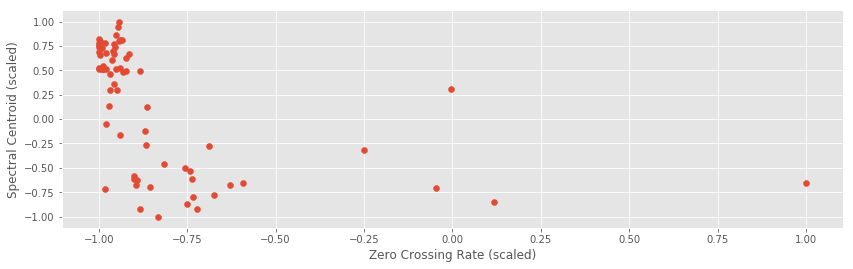

In [31]:
plt.scatter(features_scaled[:,0], features_scaled[:,1])
plt.xlabel('Zero Crossing Rate (scaled)')
plt.ylabel('Spectral Centroid (scaled)')

### K-means clustering on onset data
Use K-means to group the onset data into 2 clusters.

In [32]:
#Hint: use sklearn.cluster.KMeans, fit_predict
model = sklearn.cluster.KMeans(n_clusters = 2)
labels = model.fit(X)
print(labels)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)


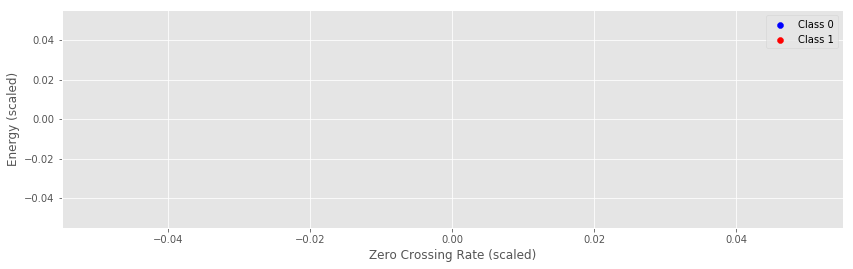

In [33]:
plt.scatter(features_scaled[labels==0,0], features_scaled[labels==0,1], c='b')
plt.scatter(features_scaled[labels==1,0], features_scaled[labels==1,1], c='r')
plt.xlabel('Zero Crossing Rate (scaled)')
plt.ylabel('Energy (scaled)')
plt.legend(('Class 0', 'Class 1'))

Onsets assigned to Class 0

In [34]:
x_with_beeps = mir_eval.sonify.clicks(onset_times[labels==0], fs, length=len(x))
IPython.display.Audio(x + x_with_beeps, rate=fs)

Onsets assigned to Class 1

In [35]:
x_with_beeps = mir_eval.sonify.clicks(onset_times[labels==1], fs, length=len(x))
IPython.display.Audio(x + x_with_beeps, rate=fs)

### Affinity Propagation
Try clustering with other clustering algorithms in scikit-learn such as affinity propagation which can cluster without defining the number of clusters beforehand

# model = sklearn.cluster.AffinityPropagation()
labels = 
print(labels)

In [15]:
plt.scatter(features_scaled[labels==0,0], features_scaled[labels==0,1], c='b')
plt.scatter(features_scaled[labels==1,0], features_scaled[labels==1,1], c='r')
plt.scatter(features_scaled[labels==2,0], features_scaled[labels==2,1], c='y')
plt.xlabel('Zero Crossing Rate (scaled)')
plt.ylabel('Energy (scaled)')
plt.legend(('Class 0', 'Class 1', 'Class 2'))

Beeps are played for each onset assigned to cluster 0

In [16]:
x_with_beeps = mir_eval.sonify.clicks(onset_times[labels==0], fs, length=len(x))
IPython.display.Audio(x + x_with_beeps, rate=fs)

Beeps are played for each onset assigned to cluster 1

In [17]:
x_with_beeps = mir_eval.sonify.clicks(onset_times[labels==1], fs, length=len(x))
IPython.display.Audio(x + x_with_beeps, rate=fs)

Beeps are played for each onset assigned to cluster 2

In [18]:
x_with_beeps = mir_eval.sonify.clicks(onset_times[labels==2], fs, length=len(x))
IPython.display.Audio(x + x_with_beeps, rate=fs)